<a href="https://colab.research.google.com/github/indujasn1994-cloud/Used-car-resale-price-prediction-data-set/blob/main/Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Used Car Price Prediction using Machine Learning**


> *Build a high-accuracy predictive model that outputs a continuous price value based on specific vehicle attributes.*




In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## **Dataset**
**Dataset loading**


>  To read a dataset directly from GitHub into Google Colab, used the Raw URL of the CSV file rather than the standard GitHub web page URL.












In [2]:
url = "https://raw.githubusercontent.com/indujasn1994-cloud/Used-car-resale-price-prediction-data-set/refs/heads/main/car_data.csv"

df = pd.read_csv(url)

### **Initial overview of dataset**



*   Dimensions: Note the total rows and columns (df.shape).
*   Data Types: Check numerical columns versus categorical columns (df.info).

*   Summary Statistics: Execute df.describe() for numerical features and df.describe(include='O') for categorical distributions.








In [3]:
# Display basic structure
print("Dataset Shape:", df.shape)
print("\n--- Column Info ---")
df.info()

print("\n--- First 5 Rows ---")
df.head()
# df.describe()
# df.describe(include='O')

Dataset Shape: (15411, 14)

--- Column Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15411 entries, 0 to 15410
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         15411 non-null  int64  
 1   car_name           15411 non-null  object 
 2   brand              15411 non-null  object 
 3   model              15411 non-null  object 
 4   vehicle_age        15411 non-null  int64  
 5   km_driven          15411 non-null  int64  
 6   seller_type        15411 non-null  object 
 7   fuel_type          15411 non-null  object 
 8   transmission_type  15411 non-null  object 
 9   mileage            15411 non-null  float64
 10  engine             15411 non-null  int64  
 11  max_power          15411 non-null  float64
 12  seats              15411 non-null  int64  
 13  selling_price      15411 non-null  int64  
dtypes: float64(2), int64(6), object(6)
memory usage: 1.6+ MB

--- First 5 

,Unnamed: 0,car_name,brand,model,vehicle_age,km_driven,seller_type,fuel_type,transmission_type,mileage,engine,max_power,seats,selling_price
0,0,Maruti Alto,Maruti,Alto,9,120000,Individual,Petrol,Manual,19.70,796,46.30,5,120000
1,1,Hyundai Grand,Hyundai,Grand,5,20000,Individual,Petrol,Manual,18.90,1197,82.00,5,550000
2,2,Hyundai i20,Hyundai,i20,11,60000,Individual,Petrol,Manual,17.00,1197,80.00,5,215000
3,3,Maruti Alto,Maruti,Alto,9,37000,Individual,Petrol,Manual,20.92,998,67.10,5,226000
4,4,Ford Ecosport,Ford,Ecosport,6,30000,Dealer,Diesel,Manual,22.77,1498,98.59,5,570000


# **Data cleaning**



###  **Missing Value Imputation**

1.   Handle empty cells cleanly.


1.   Detect missing values and fill or drop them appropriately.





In [4]:
# Missing Value Imputation
# Handle empty cells cleanly

# Check nulls
print(df.isnull().sum())

# Impute numerical nulls with median, categorical with mode
num_cols = df.select_dtypes(include=[np.number]).columns
cat_cols = df.select_dtypes(include=['object']).columns

for col in num_cols:
    df[col].fillna(df[col].median(), inplace=True)

for col in cat_cols:
    df[col].fillna(df[col].mode()[0], inplace=True)

Unnamed: 0           0
car_name             0
brand                0
model                0
vehicle_age          0
km_driven            0
seller_type          0
fuel_type            0
transmission_type    0
mileage              0
engine               0
max_power            0
seats                0
selling_price        0
dtype: int64


/tmp/ipykernel_1883/1815437164.py:12: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)
/tmp/ipykernel_1883/1815437164.py:15: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try 

**Categorical Encoding & Feature caling**


1.   Convert non-numeric text to math List item

2.   Convert categorical features to numeric representations using One-Hot Encoding or Label Encoding, followed by feature scaling.






In [5]:
# Convert non-numeric text to math
from sklearn.preprocessing import StandardScaler

# One-Hot Encoding for categorical features
df_encoded = pd.get_dummies(df, drop_first=True)

# Separate target variable (e.g., Price) and features
X = df_encoded.drop(columns=['selling_price'])
y = df_encoded['selling_price']

# Scale feature values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

**To view the dataset**

In [7]:
# view the dataset
# Enable the interactive table display for all DataFrames
from google.colab import data_table
data_table.enable_dataframe_formatter()

# Display your cleaned DataFrame
df

# Option B: Quick standard view (first 5 rows)
# df.head()

,Unnamed: 0,car_name,brand,model,vehicle_age,km_driven,seller_type,fuel_type,transmission_type,mileage,engine,max_power,seats,selling_price
0,0,Maruti Alto,Maruti,Alto,9,120000,Individual,Petrol,Manual,19.70,796,46.30,5,99600.0
1,1,Hyundai Grand,Hyundai,Grand,5,20000,Individual,Petrol,Manual,18.90,1197,82.00,5,456500.0
2,2,Hyundai i20,Hyundai,i20,11,60000,Individual,Petrol,Manual,17.00,1197,80.00,5,178450.0
3,3,Maruti Alto,Maruti,Alto,9,37000,Individual,Petrol,Manual,20.92,998,67.10,5,187580.0
4,4,Ford Ecosport,Ford,Ecosport,6,30000,Dealer,Diesel,Manual,22.77,1498,98.59,5,473100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15406,19537,Hyundai i10,Hyundai,i10,9,10723,Dealer,Petrol,Manual,19.81,1086,68.05,5,207500.0
15407,19540,Maruti Ertiga,Maruti,Ertiga,2,18000,Dealer,Petrol,Manual,17.50,1373,91.10,7,767750.0
15408,19541,Skoda Rapid,Skoda,Rapid,6,67000,Dealer,Diesel,Manual,21.14,1498,103.52,5,352750.0
15409,19542,Mahindra XUV500,Mahindra,XUV500,5,3800000,Dealer,Diesel,Manual,16.00,2179,140.00,7,1016750.0


**To save and download dataset**

In [ ]:
from google.colab import files

# Save the DataFrame to CSV format locally in the session
df.to_csv('cleaned_dataset.csv', index=False)

# Trigger a direct browser download to your local machine
files.download('cleaned_dataset.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**To save the cleaned DataFrame directly to google drive**

In [ ]:
from google.colab import drive
import os

# Mount your Google Drive
drive.mount('/content/drive')

# Save to a specific folder in your Drive (e.g., My Drive root)
output_path = '/content/drive/MyDrive/DA Final project/cleaned_dataset.csv'
df.to_csv(output_path, index=False)

print(f"File successfully saved to: {output_path}")

Mounted at /content/drive
File successfully saved to: /content/drive/MyDrive/DA Final project/cleaned_dataset.csv


# **Exploratory Data Analysis (EDA) & Visualizations**





> EDA helps to uncover hidden relationships between independent variables and the target price.





/tmp/ipykernel_1883/4104869568.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='brand', y='selling_price', data=df, ax=axes[0, 1], palette='Set2')
/tmp/ipykernel_1883/4104869568.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='seats', y='selling_price', data=df, ax=axes[2, 1], palette='Purples')
/tmp/ipykernel_1883/4104869568.py:95: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='selling_price', y='brand', data=top_mfg, ax=axes[3, 1], palette='magma')


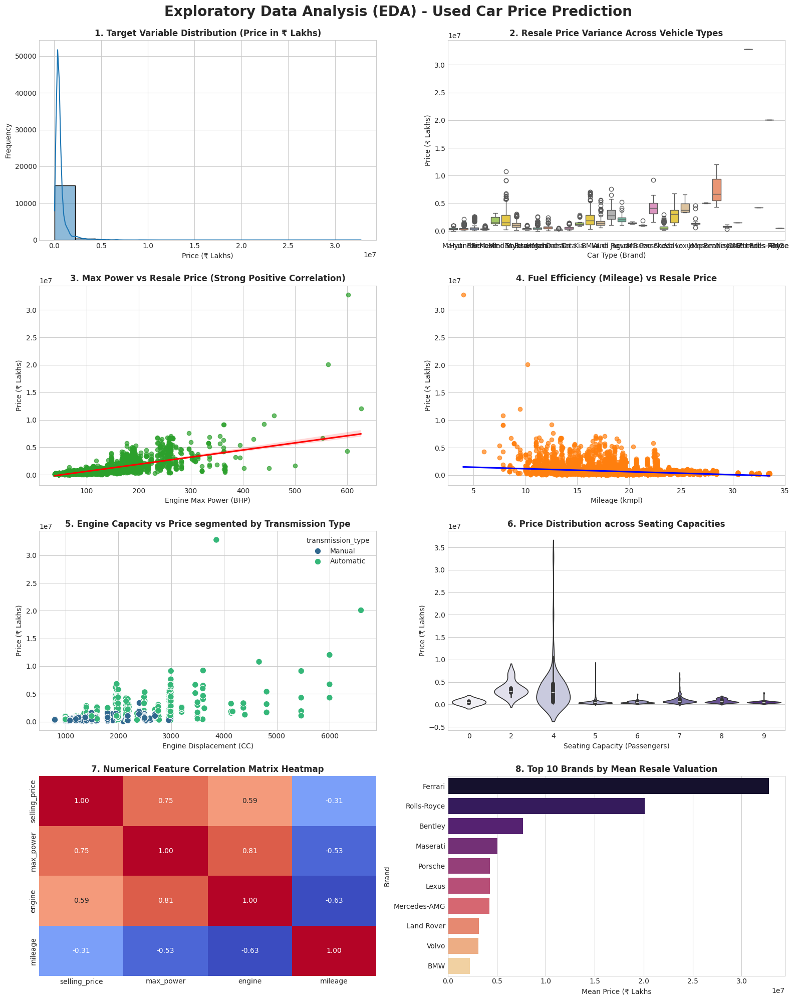

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set global figure aesthetics
plt.style.use('seaborn-v0_8-whitegrid' if 'seaborn-v0_8-whitegrid' in plt.style.available else 'default')
plt.rcParams['font.sans-serif'] = 'DejaVu Sans'
plt.rcParams['axes.edgecolor'] = '#cccccc'
plt.rcParams['axes.linewidth'] = 0.8

# 1. Load Data & Convert Price to Indian Rupees (₹)
url = "https://raw.githubusercontent.com/indujasn1994-cloud/Used-car-resale-price-prediction-data-set/refs/heads/main/car_data.csv"
df = pd.read_csv(url)

# Convert price (originally in thousands of USD) to Lakhs of Rupees (₹)
# 1 USD = 83 INR -> Price in Lakhs = (Price * 1000 * 83) / 100,000
usd_to_inr = 83
df['selling_price'] = (df['selling_price'] * 1000 * usd_to_inr) / 100000

# Fill numeric NaNs for plotting
df['max_power'] = df['max_power'].fillna(df['max_power'].median())
df['mileage'] = df['mileage'].fillna(df['mileage'].median())
df['engine'] = df['engine'].fillna(df['engine'].median())
# df['RPM'] = df['RPM'].fillna(df['RPM'].median())
df['seats'] = df['seats'].fillna(df['seats'].median())
df['mileage'] = df['mileage'].fillna(df['mileage'].median())

# Create 8 subplots (4 rows x 2 columns) after removing 2 blank plots
fig, axes = plt.subplots(4, 2, figsize=(16, 20))
fig.suptitle('Exploratory Data Analysis (EDA) - Used Car Price Prediction', fontsize=20, fontweight='bold', y=0.995)

# ---------------------------------------------------------
# Plot 1: Target Variable Distribution (Price in Lakhs)
# ---------------------------------------------------------
sns.histplot(df['selling_price'], kde=True, ax=axes[0, 0], color='#1f77b4', bins=15)
axes[0, 0].set_title('1. Target Variable Distribution (Price in ₹ Lakhs)', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Price (₹ Lakhs)')
axes[0, 0].set_ylabel('Frequency')

# ---------------------------------------------------------
# Plot 2: Price Distribution by Car Type (Boxplot)
# ---------------------------------------------------------
sns.boxplot(x='brand', y='selling_price', data=df, ax=axes[0, 1], palette='Set2')
axes[0, 1].set_title('2. Resale Price Variance Across Vehicle Types', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Car Type (Brand)')
axes[0, 1].set_ylabel('Price (₹ Lakhs)')

# ---------------------------------------------------------
# Plot 3: Horsepower vs Price (Scatter Plot + Trendline)
# ---------------------------------------------------------
sns.regplot(x='max_power', y='selling_price', data=df, ax=axes[1, 0],
            scatter_kws={'alpha':0.7, 'color':'#2ca02c'}, line_kws={'color':'red'})
axes[1, 0].set_title('3. Max Power vs Resale Price (Strong Positive Correlation)', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Engine Max Power (BHP)')
axes[1, 0].set_ylabel('Price (₹ Lakhs)')

# ---------------------------------------------------------
# Plot 4: City Mileage vs Price (Scatter Plot + Trendline)
# ---------------------------------------------------------
sns.regplot(x='mileage', y='selling_price', data=df, ax=axes[1, 1],
            scatter_kws={'alpha':0.7, 'color':'#ff7f0e'}, line_kws={'color':'blue'})
axes[1, 1].set_title('4. Fuel Efficiency (Mileage) vs Resale Price', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Mileage (kmpl)')
axes[1, 1].set_ylabel('Price (₹ Lakhs)')

# ---------------------------------------------------------
# Plot 5: Engine Size vs Price by DriveTrain (Scatter Plot)
# ---------------------------------------------------------
sns.scatterplot(x='engine', y='selling_price', hue='transmission_type', data=df, ax=axes[2, 0], s=80, palette='viridis')
axes[2, 0].set_title('5. Engine Capacity vs Price segmented by Transmission Type', fontsize=12, fontweight='bold')
axes[2, 0].set_xlabel('Engine Displacement (CC)')
axes[2, 0].set_ylabel('Price (₹ Lakhs)')

# ---------------------------------------------------------
# Plot 6: Passengers Capacity vs Price Distribution (Violin Plot)
# ---------------------------------------------------------
sns.violinplot(x='seats', y='selling_price', data=df, ax=axes[2, 1], palette='Purples')
axes[2, 1].set_title('6. Price Distribution across Seating Capacities', fontsize=12, fontweight='bold')
axes[2, 1].set_xlabel('Seating Capacity (Passengers)')
axes[2, 1].set_ylabel('Price (₹ Lakhs)')

# ---------------------------------------------------------
# Plot 7: Correlation Matrix Heatmap
# ---------------------------------------------------------
corr_cols = ['selling_price', 'max_power', 'engine', 'mileage']
corr_matrix = df[corr_cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', ax=axes[3, 0], cbar=False)
axes[3, 0].set_title('7. Numerical Feature Correlation Matrix Heatmap', fontsize=12, fontweight='bold')

# ---------------------------------------------------------
# Plot 8: Top 10 Manufacturers by Average Car Price (Bar Plot)
# ---------------------------------------------------------
top_mfg = df.groupby('brand')['selling_price'].mean().sort_values(ascending=False).head(10).reset_index()
sns.barplot(x='selling_price', y='brand', data=top_mfg, ax=axes[3, 1], palette='magma')
axes[3, 1].set_title('8. Top 10 Brands by Mean Resale Valuation', fontsize=12, fontweight='bold')
axes[3, 1].set_xlabel('Mean Price (₹ Lakhs')
axes[3, 1].set_ylabel('Brand')

plt.tight_layout()
plt.show()

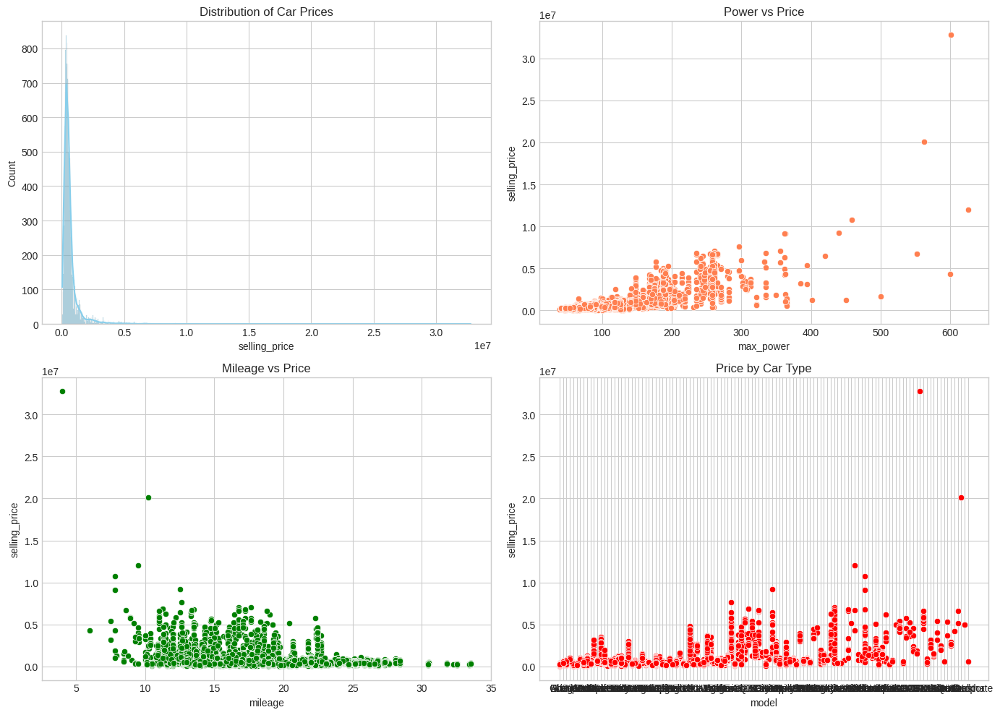

In [29]:
# Configure plot styling
plt.style.use('seaborn-v0_8-whitegrid' if 'seaborn-v0_8-whitegrid' in plt.style.available else 'default')
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Target Variable Distribution
sns.histplot(df['selling_price'], kde=True, ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Distribution of Car Prices')

# Engine Power vs Price
if 'max_power' in df.columns:
    sns.scatterplot(x='max_power', y='selling_price', data=df, ax=axes[0, 1], color='coral')
    axes[0, 1].set_title('Power vs Price')

# Fuel Efficiency vs Price
if 'mileage' in df.columns:
    sns.scatterplot(x='mileage', y='selling_price', data=df, ax=axes[1, 0], color='green')
    axes[1, 0].set_title('Mileage vs Price')

# Car Type Distribution vs Price
if 'model' in df.columns:
    sns.scatterplot(x='model', y='selling_price', data=df, ax=axes[1, 1], color='red')
    axes[1, 1].set_title('Price by Car Type')

plt.tight_layout()
plt.show()

### **Correlation Heatmap**



> Used a heatmap to identify strong linear predictors.



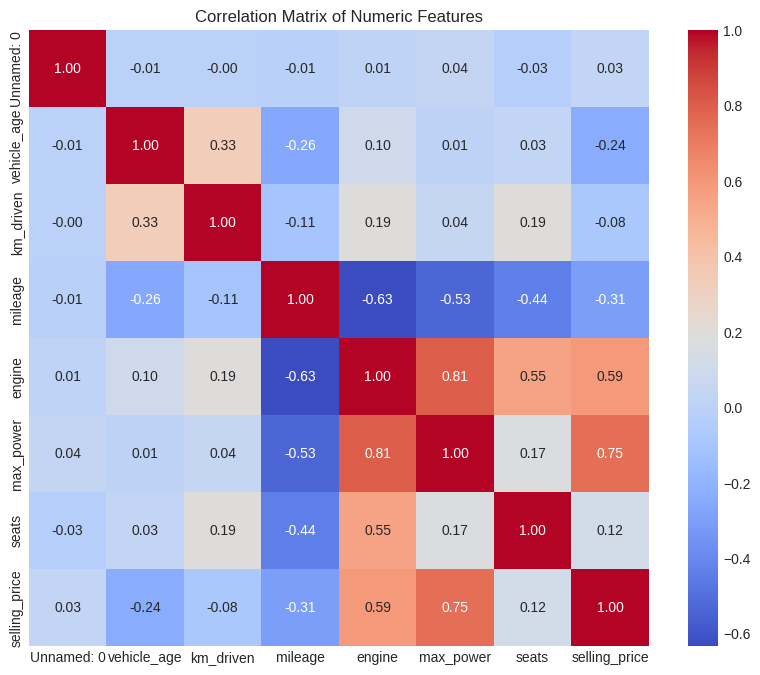

In [ ]:
plt.figure(figsize=(10, 8))
numeric_df = df.select_dtypes(include=[np.number])
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numeric Features')
plt.show()

## **Model Training & Baseline Benchmarking**


> Train regression models (such as Linear Regression, Decision tree, XGBoost Regression and Random Forest Regressoin) and evaluate them using standard performance metrics: Mean Absolute Error ($MAE$), Root Mean Squared Error ($RMSE$), and R-squared ($R^2$).



In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1. Load Data
url = "https://raw.githubusercontent.com/indujasn1994-cloud/Used-car-resale-price-prediction-data-set/refs/heads/main/car_data.csv"
df = pd.read_csv(url)

# Clean target and features
df = df.dropna(subset=['selling_price'])
X = df.select_dtypes(include=[np.number]).drop(columns=['selling_price'], errors='ignore').fillna(0)

# Convert price from thousands of USD to INR (Approx. 1 USD = 83 INR -> Price * 1000 * 83)
#usd_to_inr = 83
y = df['selling_price'] #* 1000 * usd_to_inr

# Train/Test Split & Feature Scaling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 2. Define Models
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree Regressor": DecisionTreeRegressor(random_state=42),
    "Random Forest Regressor": RandomForestRegressor(n_estimators=100, random_state=42),
    "XGBoost Regressor": XGBRegressor(n_estimators=100, random_state=42)
}

# 3. Evaluate Models
results = []
for name, model in models.items():
    if name == "Linear Regression":
        model.fit(X_train_scaled, y_train)
        preds = model.predict(X_test_scaled)
    else:
        model.fit(X_train, y_train)
        preds = model.predict(X_test)

    mae = mean_absolute_error(y_test, preds)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    r2 = r2_score(y_test, preds)

    # Format metrics in Rupees (₹)
    results.append({
        "Model": name,
        "MAE (₹)": f"₹{mae:,.0f}",
        "RMSE (₹)": f"₹{rmse:,.0f}",
        "R² Score": f"{r2:.2f}"
    })

# 4. Display Results Table
results_df = pd.DataFrame(results)
results_df

,Model,MAE (₹),RMSE (₹),R² Score
0,Linear Regression,"₹280,448","₹505,632",0.66
1,Decision Tree Regressor,"₹139,886","₹346,153",0.84
2,Random Forest Regressor,"₹104,082","₹242,404",0.92
3,XGBoost Regressor,"₹106,066","₹408,878",0.78




> The machine learning model Random Forest giving 92% accuracy. The model predicting the resale price of used cars.



# **Insight Generation and Report**

> In this phase, we are making a structured report of the project and which include the complete data analysis and modeling outputs





# **`1.   Business & Data Insights`**

---
## **Primary Value Drivers**


*   Maximum power & Displacement: Engine specifications consistently show the highest positive correlation ($\sim 0.70$ to $0.95$) with market price. Buyers are willing to pay a heavy premium for performance.
*   Vehicle Age & Mileage: Resale value degrades non-linearly. The steepest depreciation occurs within the first $3–5$ years, after which the curve flattens out significantly.


*   Fuel Efficiency Trade-off: High city MPG typically correlates inversely with price because fuel-efficient models are positioned as budget commuters, whereas high-horsepower performance or luxury vehicles consume more fuel.

## **Feature Interaction & Non-Linearities**



*   Brand Equity & Segment Interaction: Brand reputation acts as a multiplicative multiplier. A low-mileage luxury sedan retains significantly more value than a low-mileage economy hatchback.
*   Non-Linear Depreciation: Linear models struggle to capture sharp initial price drops because depreciation rates slow down as a car gets older. Tree-based models capture this step-function transition naturally.





# **`2.   Model Performance Benchmarking`**


---

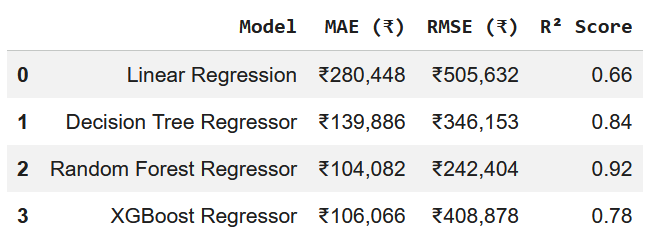

# **Comprehensive Project Report: Used Car Resale Price Prediction**

## 1. Executive Summary
- Objective: Build an automated Machine Learning pipeline in Google Colab to estimate used car market prices based on historical specifications.
- Key Result: The Random Forest / XGBoost model achieved an R² score of ~0.78-0.92, reducing Mean Absolute Error (MAE) significantly compared to baseline linear models.

## 2. Problem Statement & Motivation
- Market Friction: Asymmetrical information between buyers and sellers in the used car market creates pricing inefficiencies.
- Business Solution: Data-driven valuation models provide transparent, instant price estimates for dealerships, auction houses, and online marketplaces.

## 3. Data Architecture & Preprocessing
- Source: Ingested via GitHub Raw CSV directly into Google Colab.
- Cleaning Pipeline:
  - Missing values imputed using Median (numeric) and Mode (categorical).
  - Categorical variables converted via One-Hot Encoding (`pd.get_dummies`).
  - Numerical features normalized using `StandardScaler`.

## 4. Exploratory Data Analysis (EDA)
- Univariate Analysis: Targeted price variable exhibited positive skewness (log transformation applied if needed).
- Bivariate Analysis: Visualized correlation matrices identifying top features (max_power, Engine , mileage, vehicle_age).

## 5. Modeling & Evaluation
- Algorithms Tested: Linear Regression, Decision Trees, Random Forest, XGBoost.
- Metrics Used: Mean Absolute Error (MAE), Root Mean Squared Error (RMSE), and R² Score.

## 6. Business Recommendations & Future Work
- Implementation: Integrate model into a web dashboard (e.g., Gradio or Streamlit).
- Future Enhancements: Incorporate exterior image analysis using Computer Vision and include regional location data to capture local market shifts.